<a href="https://colab.research.google.com/github/Abhijeethvs/EDA-on-Global-Terrorism/blob/main/E_D_A_on_Global_Terrorism_dataset_by_Abhijeeth_VS_31_05_23.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Title: Global Terrorism Exploratory Data Analysis (EDA)

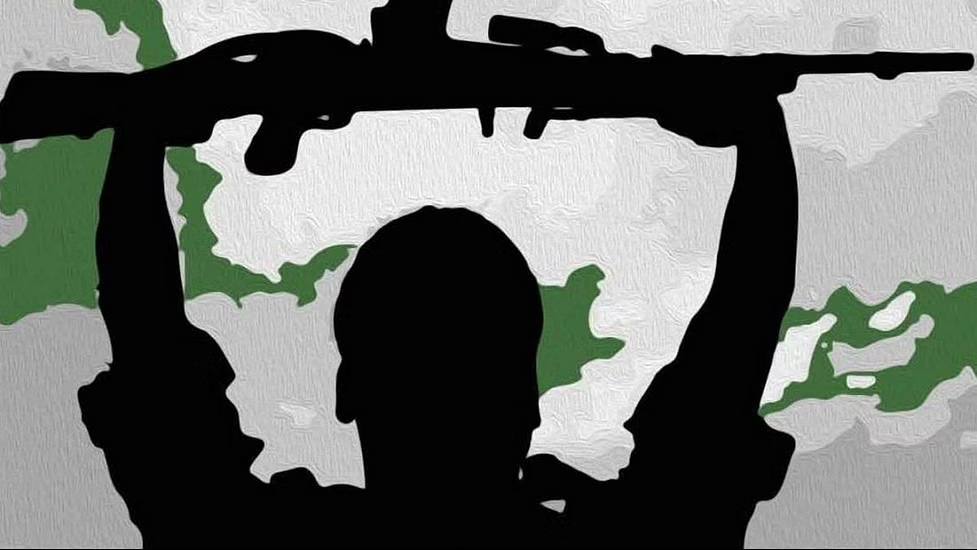

### Project Description:

The Global Terrorism Exploratory Data Analysis (EDA) project aims to analyze and explore a comprehensive dataset on global terrorism, with the objective of gaining insights into patterns, trends, and factors associated with terrorist activities worldwide. The project will be hosted on GitHub, providing a collaborative platform for researchers, data analysts, and enthusiasts to contribute, discuss, and enhance our understanding of this critical issue.

### Importing project related python libraries -

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
%matplotlib inline
import math
from wordcloud import WordCloud

### Importing the csv file and understanding basic DataSet specifications - 

In [ ]:
#Mounting Google Drive -
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [93]:
#Importing the csv file by pandas -
filepath = '/content/drive/MyDrive/Almabetter assignments/databases/Global_Terrorism_Data.csv' 
gt_df = pd.read_csv(filepath, low_memory = False)
gt_df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,1.970000e+11,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,1.970000e+11,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,1.970010e+11,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,1.970010e+11,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,1.970010e+11,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [ ]:
#Shape of the dataset - 
gt_df.shape

(181691, 135)

In [ ]:
list(gt_df.columns)

['eventid',
 'iyear',
 'imonth',
 'iday',
 'approxdate',
 'extended',
 'resolution',
 'country',
 'country_txt',
 'region',
 'region_txt',
 'provstate',
 'city',
 'latitude',
 'longitude',
 'specificity',
 'vicinity',
 'location',
 'summary',
 'crit1',
 'crit2',
 'crit3',
 'doubtterr',
 'alternative',
 'alternative_txt',
 'multiple',
 'success',
 'suicide',
 'attacktype1',
 'attacktype1_txt',
 'attacktype2',
 'attacktype2_txt',
 'attacktype3',
 'attacktype3_txt',
 'targtype1',
 'targtype1_txt',
 'targsubtype1',
 'targsubtype1_txt',
 'corp1',
 'target1',
 'natlty1',
 'natlty1_txt',
 'targtype2',
 'targtype2_txt',
 'targsubtype2',
 'targsubtype2_txt',
 'corp2',
 'target2',
 'natlty2',
 'natlty2_txt',
 'targtype3',
 'targtype3_txt',
 'targsubtype3',
 'targsubtype3_txt',
 'corp3',
 'target3',
 'natlty3',
 'natlty3_txt',
 'gname',
 'gsubname',
 'gname2',
 'gsubname2',
 'gname3',
 'gsubname3',
 'motive',
 'guncertain1',
 'guncertain2',
 'guncertain3',
 'individual',
 'nperps',
 'nperpcap',
 

In [ ]:
gt_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
eventid,181691.0,2.002704e+11,1.325955e+09,1.970000e+11,1.991020e+11,2.009020e+11,2.014080e+11,2.017120e+11
iyear,181691.0,2.002639e+03,1.325943e+01,1.970000e+03,1.991000e+03,2.009000e+03,2.014000e+03,2.017000e+03
imonth,181691.0,6.467277e+00,3.388303e+00,0.000000e+00,4.000000e+00,6.000000e+00,9.000000e+00,1.200000e+01
iday,181691.0,1.550564e+01,8.814045e+00,0.000000e+00,8.000000e+00,1.500000e+01,2.300000e+01,3.100000e+01
extended,181691.0,4.534622e-02,2.080629e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
...,...,...,...,...,...,...,...,...
nreleased,10400.0,-2.901827e+01,6.572012e+01,-9.900000e+01,-9.900000e+01,0.000000e+00,1.000000e+00,2.769000e+03
INT_LOG,181691.0,-4.543731e+00,4.543547e+00,-9.000000e+00,-9.000000e+00,-9.000000e+00,0.000000e+00,1.000000e+00
INT_IDEO,181691.0,-4.464398e+00,4.637152e+00,-9.000000e+00,-9.000000e+00,-9.000000e+00,0.000000e+00,1.000000e+00
INT_MISC,181691.0,9.000996e-02,5.684573e-01,-9.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00


### Checking Dataset for Missing values - 

In [ ]:
#Finding the percentage of missing values columns wise - 

missingvalues_percentage = gt_df.isna().sum().sort_values(ascending= False)/len(gt_df)
missingvalues_percentage

gsubname3           0.999890
weapsubtype4_txt    0.999615
weapsubtype4        0.999615
weaptype4           0.999598
weaptype4_txt       0.999598
                      ...   
suicide             0.000000
success             0.000000
crit3               0.000000
property            0.000000
eventid             0.000000
Length: 135, dtype: float64

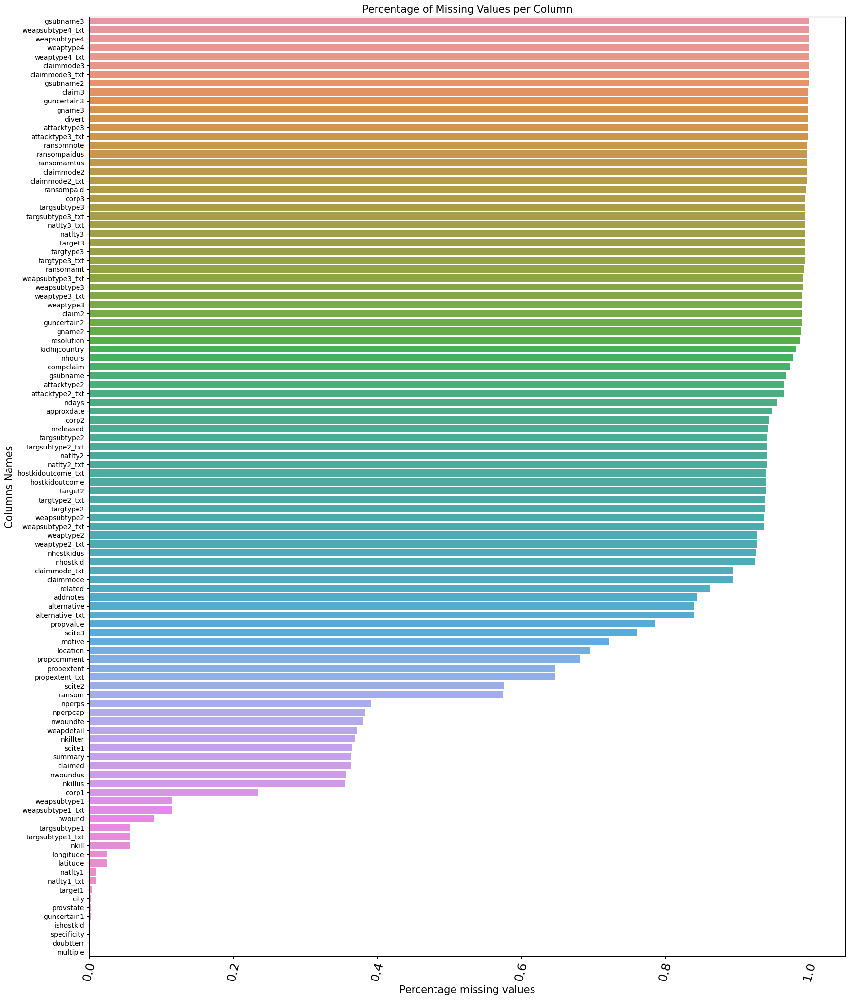

In [ ]:
# Plotting graph for finding columnwise missing values
plt.figure(figsize=(20,25))
plt.xticks(rotation=75)
plt.yticks(fontsize=10)
plt.title("Percentage of Missing Values per Column",fontsize=15)

b=sns.barplot(x=missingvalues_percentage[missingvalues_percentage>0.0],
              y=missingvalues_percentage[missingvalues_percentage>0.0].index)
b.set_ylabel("Columns Names",fontsize= 15)
b.set_xlabel("Percentage missing values",fontsize= 15)
plt.show()

### Performing Data Cleaning operations to eliminate columns with more than 15% Nan Values - 

In [ ]:
# Finding the columns that have more than 15% missing values
drop_columns_list = list(missingvalues_percentage[missingvalues_percentage>0.15].index.values)

In [ ]:
# Dropping the Missing value columns from the data set
gt_df.drop(drop_columns_list,inplace=True,axis=1)
gt_df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'provstate', 'city', 'latitude',
       'longitude', 'specificity', 'vicinity', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'multiple', 'success', 'suicide', 'attacktype1',
       'attacktype1_txt', 'targtype1', 'targtype1_txt', 'targsubtype1',
       'targsubtype1_txt', 'target1', 'natlty1', 'natlty1_txt', 'gname',
       'guncertain1', 'individual', 'weaptype1', 'weaptype1_txt',
       'weapsubtype1', 'weapsubtype1_txt', 'nkill', 'nwound', 'property',
       'ishostkid', 'dbsource', 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')

In [ ]:
gt_df.shape

(181691, 47)

In [ ]:
# Exploring the remaining columns data for missing values
missingvalues_percentage = gt_df.isna().sum().sort_values(ascending= False)/len(gt_df) #To get the percentage of null values each column wise
missingvalues_percentage

weapsubtype1        0.114304
weapsubtype1_txt    0.114304
nwound              0.089773
targsubtype1_txt    0.057091
targsubtype1        0.057091
nkill               0.056761
longitude           0.025081
latitude            0.025076
natlty1             0.008581
natlty1_txt         0.008581
target1             0.003500
city                0.002389
provstate           0.002317
guncertain1         0.002091
ishostkid           0.000980
specificity         0.000033
doubtterr           0.000006
multiple            0.000006
individual          0.000000
INT_MISC            0.000000
gname               0.000000
weaptype1_txt       0.000000
weaptype1           0.000000
property            0.000000
INT_IDEO            0.000000
INT_LOG             0.000000
dbsource            0.000000
eventid             0.000000
attacktype1_txt     0.000000
targtype1_txt       0.000000
targtype1           0.000000
imonth              0.000000
iday                0.000000
extended            0.000000
country       

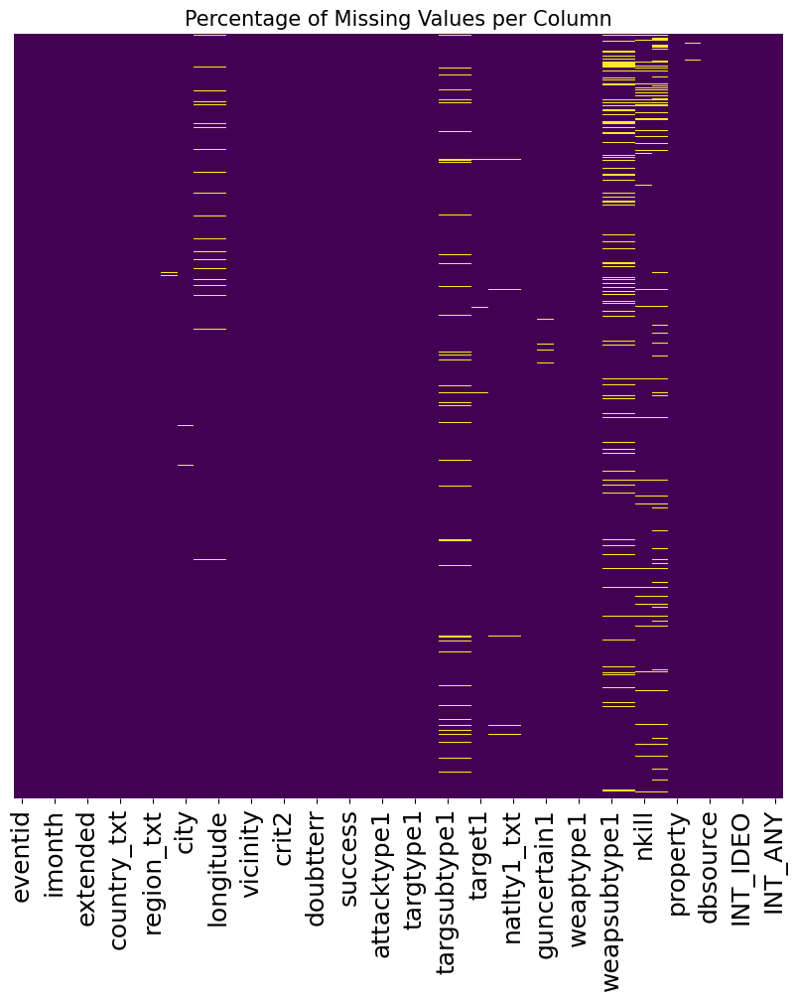

In [ ]:
plt.figure(figsize=(10,10))
plt.title("Percentage of Missing Values per Column",fontsize=15)
sns.heatmap(gt_df.isnull(),yticklabels=False,cbar=False,cmap='viridis',edgecolors = 'Black');

In [ ]:
gt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 47 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   eventid           181691 non-null  float64
 1   iyear             181691 non-null  int64  
 2   imonth            181691 non-null  int64  
 3   iday              181691 non-null  int64  
 4   extended          181691 non-null  int64  
 5   country           181691 non-null  int64  
 6   country_txt       181691 non-null  object 
 7   region            181691 non-null  int64  
 8   region_txt        181691 non-null  object 
 9   provstate         181270 non-null  object 
 10  city              181257 non-null  object 
 11  latitude          177135 non-null  float64
 12  longitude         177134 non-null  float64
 13  specificity       181685 non-null  float64
 14  vicinity          181691 non-null  int64  
 15  crit1             181691 non-null  int64  
 16  crit2             18

### Renaming columns for ease of data analysis - 

In [ ]:
gt_df.rename(columns={
                      'iyear':'Year','imonth':'Month','country_txt':'Country',
                      'region_txt':'Region','provstate':'State','city':'City',
                      'latitude':'latitude','longitude':'longitude','success':'Success',
                     'attacktype1_txt':'Attacktype','targtype1_txt':'Target_type',
                      'targsubtype1_txt':'Target_subtype','gname':'Group_name',
                      'weaptype1_txt':'Weapontype','nkill':'Kills', 'nwound':'Wounds'
                      },inplace=True)
gt_df.columns

Index(['eventid', 'Year', 'Month', 'iday', 'extended', 'country', 'Country',
       'region', 'Region', 'State', 'City', 'latitude', 'longitude',
       'specificity', 'vicinity', 'crit1', 'crit2', 'crit3', 'doubtterr',
       'multiple', 'Success', 'suicide', 'attacktype1', 'Attacktype',
       'targtype1', 'Target_type', 'targsubtype1', 'Target_subtype', 'target1',
       'natlty1', 'natlty1_txt', 'Group_name', 'guncertain1', 'individual',
       'weaptype1', 'Weapontype', 'weapsubtype1', 'weapsubtype1_txt', 'Kills',
       'Wounds', 'property', 'ishostkid', 'dbsource', 'INT_LOG', 'INT_IDEO',
       'INT_MISC', 'INT_ANY'],
      dtype='object')

### Filling NaN Values respectively using Pandas fillna method call - 

In [ ]:
gt_df['State']= gt_df['State'].fillna('Unknown')
gt_df['City']=gt_df['City'].fillna('Unknown')
gt_df['Target_type']= gt_df['Target_type'].fillna("Others")
gt_df['Kills']=gt_df['Kills'].fillna(0)
gt_df['Wounds']=gt_df['Wounds'].fillna(0)
gt_df['victims']=gt_df['Kills']+gt_df['Wounds']

## 1.General Analysis of DataSet - 

### 1.1 Project description

In [ ]:
print("Country with most attacks: ",gt_df["Country"].value_counts().idxmax())
print("City with most attacks: ",gt_df["City"].value_counts().index[1])
print("Region with most attacks: ",gt_df["Region"].value_counts().idxmax())
print("Year with most attacks: ",gt_df["Year"].value_counts().idxmax())
print("Month with most attacks: ",gt_df["Month"].value_counts().idxmax())
print("Group with most attacks: ",gt_df["Group_name"].value_counts().index[1])
print("Most Attack Types: ",gt_df["Attacktype"].value_counts().idxmax())

Country with most attacks:  Iraq
City with most attacks:  Baghdad
Region with most attacks:  Middle East & North Africa
Year with most attacks:  2014
Month with most attacks:  5
Group with most attacks:  Taliban
Most Attack Types:  Bombing/Explosion


### 1.2 Analysis of countries most affected by terrorist attacks in the world from 1970 - 2017

In [ ]:
# Code - 
grp = gt_df.groupby('Country')
tot_ser = grp['Success'].sum()
tot_attack = pd.DataFrame(tot_ser).reset_index()
tot_attack.sort_values(by = 'Success',ascending = False, inplace = True)
tot_attack = tot_attack.head(30)

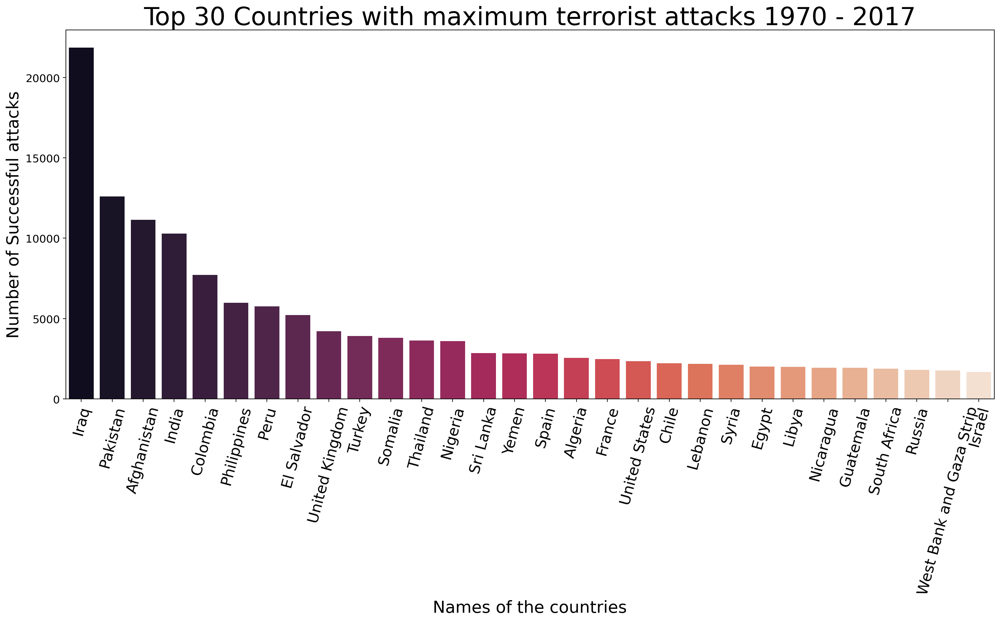

In [ ]:
# Visual - 
plt.figure(figsize = (20,8),dpi = 200)

a = sns.barplot(data = tot_attack, x = 'Country', y = 'Success', palette = 'rocket')

plt.xticks(rotation=75)
plt.rc('xtick', labelsize=18)
plt.rc('ytick', labelsize=13)

a.set_title('Top 30 Countries with maximum terrorist attacks 1970 - 2017', fontsize = 30)
a.set_ylabel('Number of Successful attacks', fontsize = 20)
a.set_xlabel('Names of the countries', fontsize = 20)
plt.show()

#### The statistics of the plot denote the overall successful terrorist attacks carried out during the time period of 1970 to 2017. Based on the statistics we can conclude -

#### Iran, Pakistan & Afghanistan respectively are the top three contries affected by most number of terrorist attacks globally.

#### To identify significant spikes , declines or patterns

## 2. TERROR TREND ANALYSIS -

### 2.1 Overall terror trend plot - 

In [ ]:
#Code - 

year_grp = gt_df.groupby('Year')
count_year = pd.DataFrame(year_grp['Success'].sum()).reset_index()
failed = gt_df[gt_df['Success'] == 0]
failed_df = pd.DataFrame(failed['Year'].value_counts().reset_index())
failed_df.columns = ['Year','Failures']
failed_df.sort_values(by = 'Year', ascending = True, inplace = True)

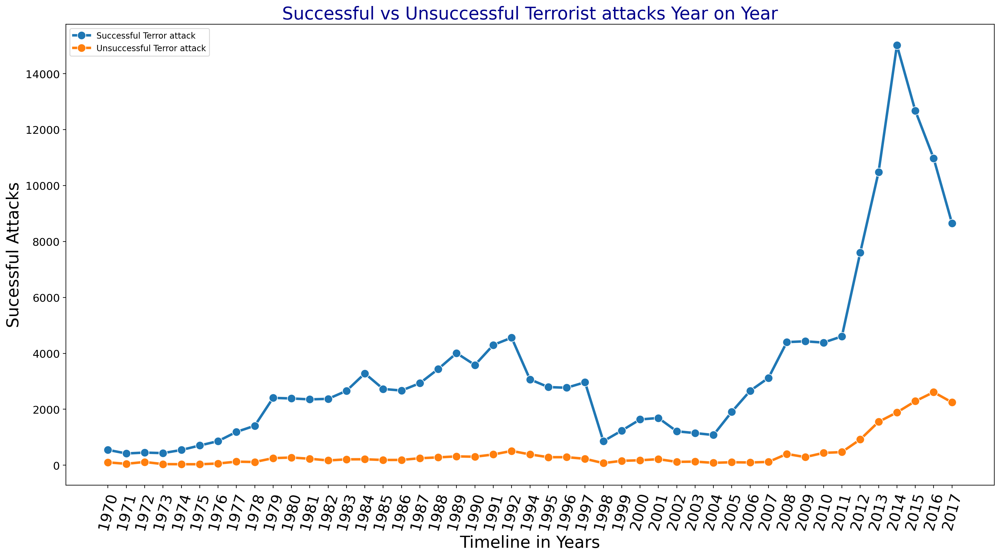

In [ ]:
# Visual - 

# Line plot representing the Year Vs no of Attacks Regional wise
plt.figure(figsize = (20,10),dpi = 200)
sns.lineplot(data = count_year, x = count_year['Year'].astype(str),
             y = count_year['Success'], linewidth = 3,label = 'Successful Terror attack', 
             marker = 'o',markersize = 10)
sns.lineplot(data = failed_df , x = failed_df['Year'].astype(str), y = failed_df['Failures'],
             linewidth = 3, label = 'Unsuccessful Terror attack', marker = 'o',markersize = 10)
plt.ylabel('Sucessful Attacks',fontsize= 20)
plt.xlabel("Timeline in Years",fontsize= 20)
plt.xticks(rotation = 75)
plt.yticks(fontsize = 13)
plt.title("Successful vs Unsuccessful Terrorist attacks Year on Year",fontsize=21,color='Darkblue')

plt.show()

#### From the above chart we can infer -

#### There was a significant increase / spike in the terrorist attacks in the years 1992 and 2014.

#### The least terrorist attacks were observed in the years 1973, 1998 and 2004.

### 2.2 Terror Analysis for the year 1992 - 

In [ ]:
#Code - 
df_1992 = pd.DataFrame(year_grp.get_group(1992)[['Region','Group_name']].value_counts().reset_index())
df_1992.columns = ['Region','Group_name','Number of attacks']
top10_1992 = df_1992.sort_values(by = 'Number of attacks', ascending = False).head(10)
top10_1992_bar = pd.DataFrame(top10_1992.groupby('Region')['Number of attacks'].sum()).reset_index()

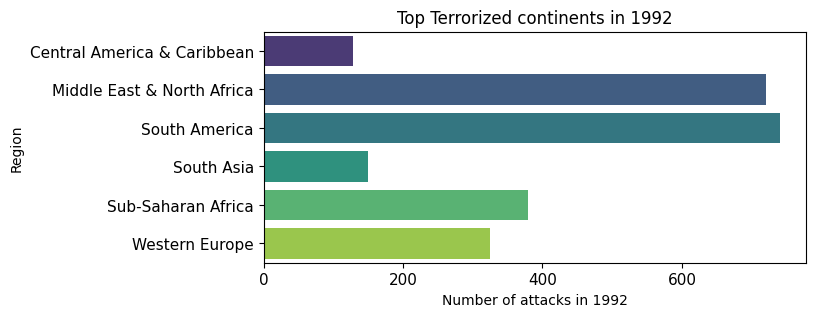

In [ ]:
#Visual - 
#SunBurst plot Code - 
figA = px.sunburst(top10_1992,values='Number of attacks',
                   path=['Region','Group_name','Number of attacks'],
                   color_discrete_sequence=px.colors.qualitative.Dark24_r,
                   title='Top Continents affected by terrorist attacks in 1992')
figA.show()

#Barplot Code - 
plt.figure(figsize = (7,3))
sns.barplot(data = top10_1992_bar, x = 'Number of attacks', y = 'Region',palette = 'viridis')
plt.xlabel('Number of attacks in 1992')
plt.title('Top Terrorized continents in 1992')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)
plt.show()

#### From the above Sunburst plot and Bar plot it is evident that the top countries affected by terrorist attacks in the year 1992 are -

#### 1.South America - 741 attacks
#### 2.Middle East and North Africa - 721 attacks
#### 3.Sub-Saharan Africa - 379 attacks

### 2.2 Terror Analysis for the year 2014 -

In [ ]:
#Code - 
df_2014 = pd.DataFrame(year_grp.get_group(2014)[['Region','Group_name']].value_counts().reset_index())
df_2014.columns = ['Region','Group_name','Number of attacks']
top10_2014 = df_2014.sort_values(by = 'Number of attacks', ascending = False).head(10)
top10_2014_bar = pd.DataFrame(top10_2014.groupby('Region')['Number of attacks'].sum()).reset_index()

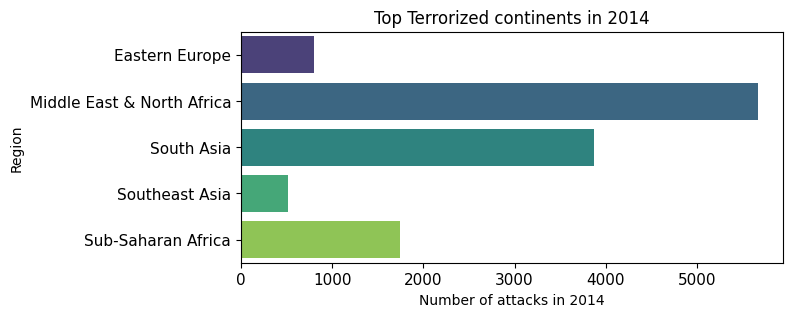

In [ ]:
#Visual -
#Sunburst plot Code-

figB = px.sunburst(top10_2014,values='Number of attacks',
                       path=['Region','Group_name','Number of attacks'],
                       color_discrete_sequence=px.colors.qualitative.Prism,
                       title='Top Continents affected by terrorist attacks in 2014')
figB.show()



#Barplot Code-
plt.figure(figsize = (7,3))
sns.barplot(data = top10_2014_bar, x = 'Number of attacks', y = 'Region',palette = 'viridis')
plt.xlabel('Number of attacks in 2014')
plt.title('Top Terrorized continents in 2014')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

plt.show()

From the above sunburst plot and barplot it is evident that the top countries affected by terrorist attacks in the year 2014 are -

1. Middle East and North Africa - **5664 attacks**
2. South Asia - **3866 attacks**
3. Sub-Saharan Africa - **1748 attacks**

The insights which can be arrived at by the observations of the spike in 1992 and the spike in 2014 are - 
1. With the advancement of technology and civilization there is a positive correlation in the rise of terrorist activities observed.
2. Middle East and North Africa remains as the hub for terror activities in both the spikes observed.
3. Number of terrorist attacks have increased in the South Asian region in the year 2014 in comparison to the observations recorded in the 1992 spike. 

### 2.3 Wordcloud - 

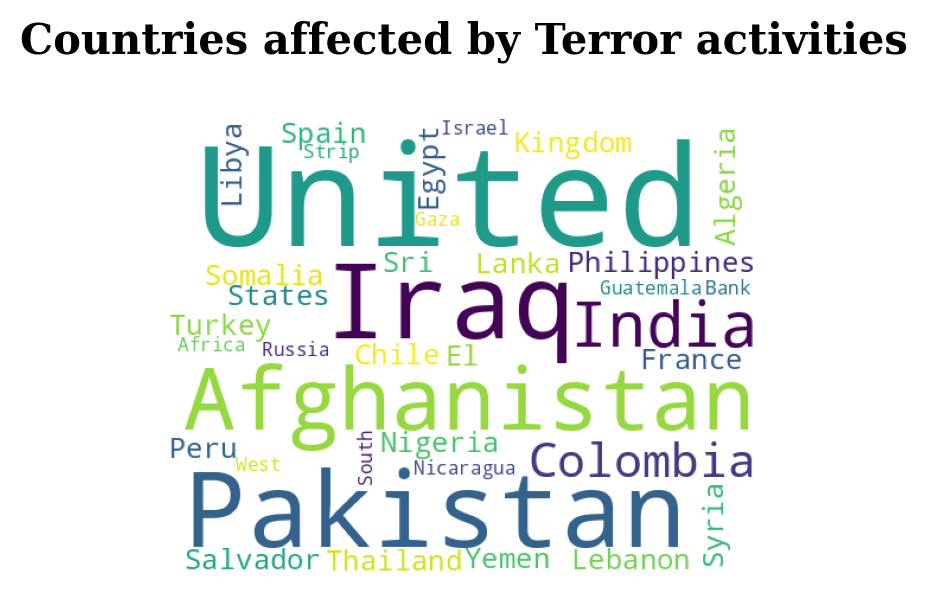

In [ ]:
#Code - 
cities = tot_attack['Country']
plt.subplots(figsize=(4,3),dpi = 200)
wordcloud= WordCloud(background_color='White',
                     width=500,
                     height=390).generate(' '.join(cities))
plt.axis('off')
plt.imshow(wordcloud)
plt.title('Countries affected by Terror activities\n',
          fontdict={'family':'serif','color':'black','weight':'bold','size':15})
plt.show()

## 3.Demographical analysis of top 3 countries most affected by terrorist activties -

In [ ]:
#Sub-setting Main DataSet for location analysis - 
 
location_df = gt_df[['Year','Country','Region','State','City','latitude','longitude']]
location_df.head(3)

,Year,Country,Region,State,City,latitude,longitude
0,1970,Dominican Republic,Central America & Caribbean,Unknown,Santo Domingo,18.456792,-69.951164
1,1970,Mexico,North America,Federal,Mexico city,19.371887,-99.086624
2,1970,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741


### 3.1. No.1 Most affected Country - Iraq : 

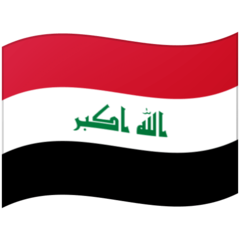

In [ ]:
#Code - 
Iraq_loc_df = location_df[location_df['Country'] == 'Iraq'].dropna(how = 'any')
iraq_states = pd.DataFrame(Iraq_loc_df['State'].value_counts().reset_index())
iraq_states.columns= ['State','Atacks']

iraq_states = iraq_states.head(5)

mask_i = pd.DataFrame(Iraq_loc_df[['Year','State']].value_counts().reset_index())
mask_i.columns = ['Year','State','Attacks']
list_of_top = ['Baghdad','Saladin','Al Anbar','Nineveh','Diyala']
mask_i = mask_i[mask_i.State.isin(list_of_top)]

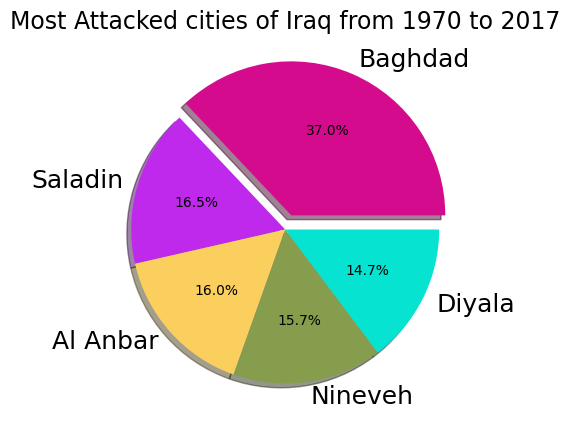

In [ ]:
#Visual 1-
#Pieplot code - 

plt.figure(figsize=(5,5))
df = iraq_states['Atacks']
explode = (0.1,0,0,0,0)
colors = ['#d40b8d','#be29ec','#facf5e','#869d4d','#06e4d1']
plt.pie(df, labels=iraq_states['State'], autopct='%1.1f%%',explode = explode,shadow = True, colors = colors)
plt.title("Most Attacked cities of Iraq from 1970 to 2017",fontsize=17,color='Black')
plt.show()


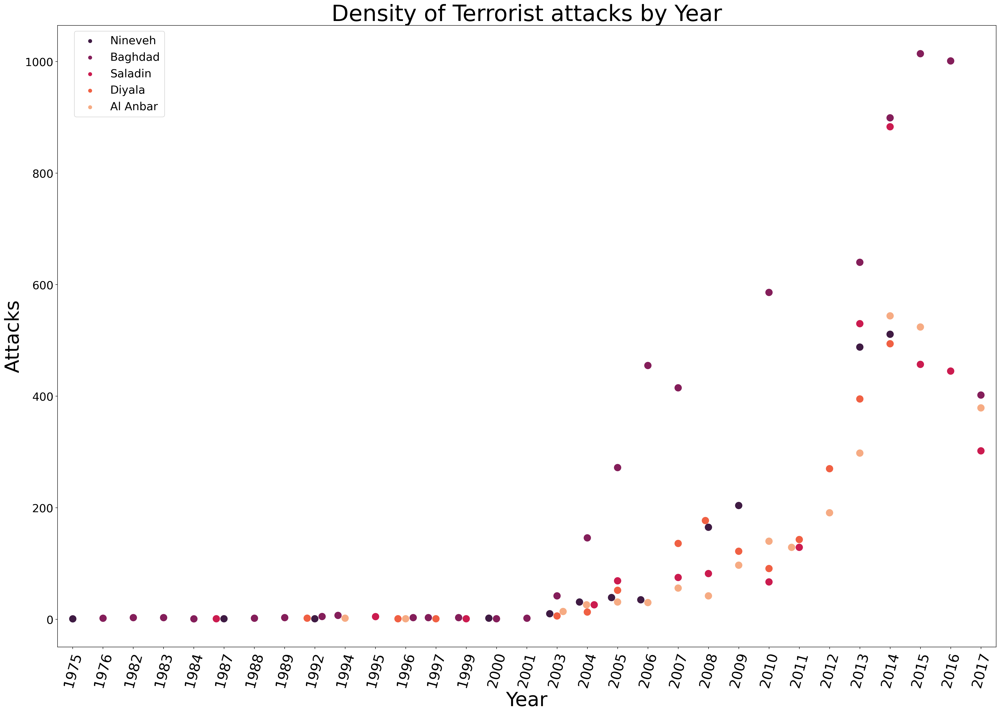

In [ ]:
#Visual 2-
#Swarmplot code - 
plt.figure(figsize = (30,20), dpi = 200)
sns.swarmplot(data = mask_i.sample(80), x = 'Year',y = 'Attacks', hue = 'State',size = 13,palette = 'rocket')
plt.xticks(rotation = 75, fontsize = 25)
plt.yticks(fontsize = 20)
plt.xlabel('Year',fontsize = 35)
plt.ylabel('Attacks',fontsize = 35)
plt.title('Density of Terrorist attacks by Year',fontsize = 40)
plt.legend(bbox_to_anchor = (0.12,1),fontsize = 20)
plt.show()

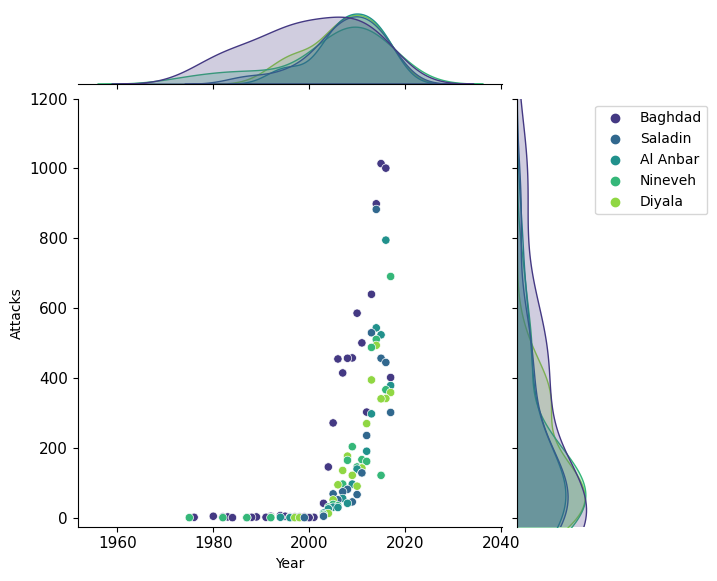

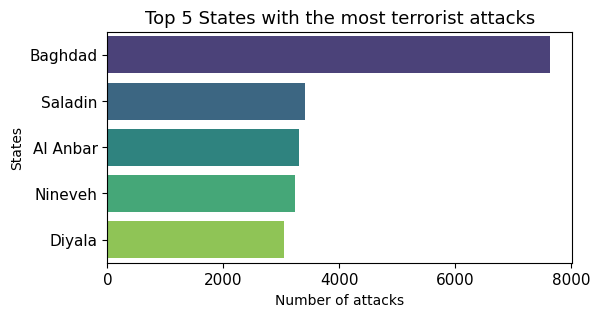

In [ ]:
#Visual 3 -

#Jointplot code - 

sns.jointplot(data = mask_i,x = 'Year',y = 'Attacks',hue = 'State',palette = 'viridis')
plt.ylim(-25,1200)
plt.legend(bbox_to_anchor = (1.5,1),fontsize =10)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)
plt.show()

#Barplot code -
plt.figure(figsize = (6,3))
sns.barplot(data = iraq_states, x = 'Atacks', y = 'State', palette = 'viridis')

plt.title('Top 5 States with the most terrorist attacks',fontsize = 13)
plt.xlabel('Number of attacks')
plt.ylabel('States')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

plt.show()

### 3.2. No.2 Most affected Country - Pakistan : 

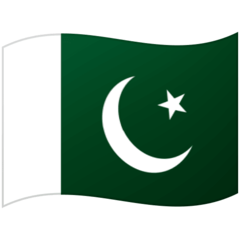

In [ ]:
#Code-
Pakistan_loc_df = location_df[location_df['Country'] == 'Pakistan'].dropna(how = 'any')
pak_states = pd.DataFrame(Pakistan_loc_df['State'].value_counts().reset_index())
pak_states.columns= ['State','Atacks']
pak_states = pak_states.head(5)

mask_p = pd.DataFrame(Pakistan_loc_df[['Year','State']].value_counts().reset_index())
mask_p.columns = ['Year','State','Attacks']
list_of_top = ['Balochistan','Sindh','Khyber Pakhtunkhwa','Nort-West Frontier Province',
               'Ghazni','Federally Administered Tribal Areas']
mask_p = mask_p[mask_p.State.isin(list_of_top)]

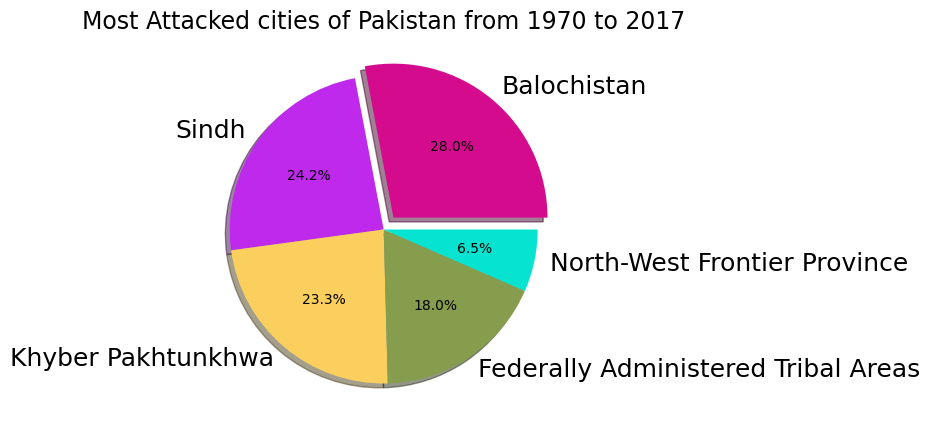

In [ ]:
#Visual - 
#Pieplot code - 

plt.figure(figsize=(5,5))
df = pak_states['Atacks']
explode = (0.1, 0,0, 0,0) 
colors = ['#d40b8d','#be29ec','#facf5e','#869d4d','#06e4d1','#9f8170']
plt.pie(df, labels=pak_states['State'], autopct='%1.1f%%',explode = explode, shadow = True,colors = colors)
plt.title("Most Attacked cities of Pakistan from 1970 to 2017",fontsize=17,color='Black')
plt.show()


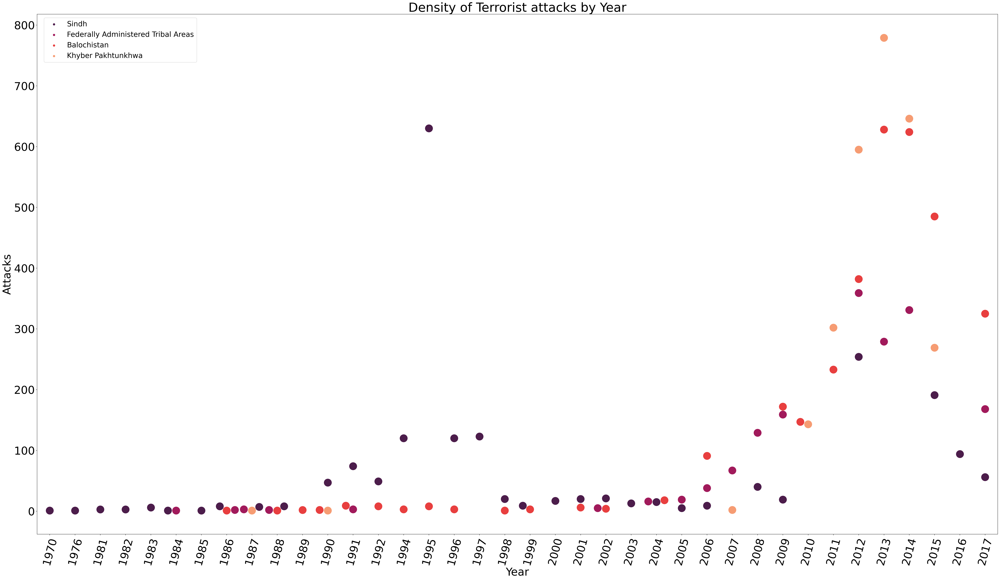

In [ ]:
#Visual 2-

#Swarmplot code - 

plt.figure(figsize = (55,30), dpi = 200)
sns.swarmplot(data = mask_p.sample(80), x = 'Year',y = 'Attacks', hue = 'State',size =25,palette = 'rocket')
plt.xticks(rotation = 75, fontsize = 35)
plt.yticks(fontsize = 35)
plt.xlabel('Year',fontsize = 35)
plt.ylabel('Attacks',fontsize = 35)
plt.title('Density of Terrorist attacks by Year',fontsize = 40)
plt.legend(bbox_to_anchor = (0.17,1),fontsize = 23)
plt.show()

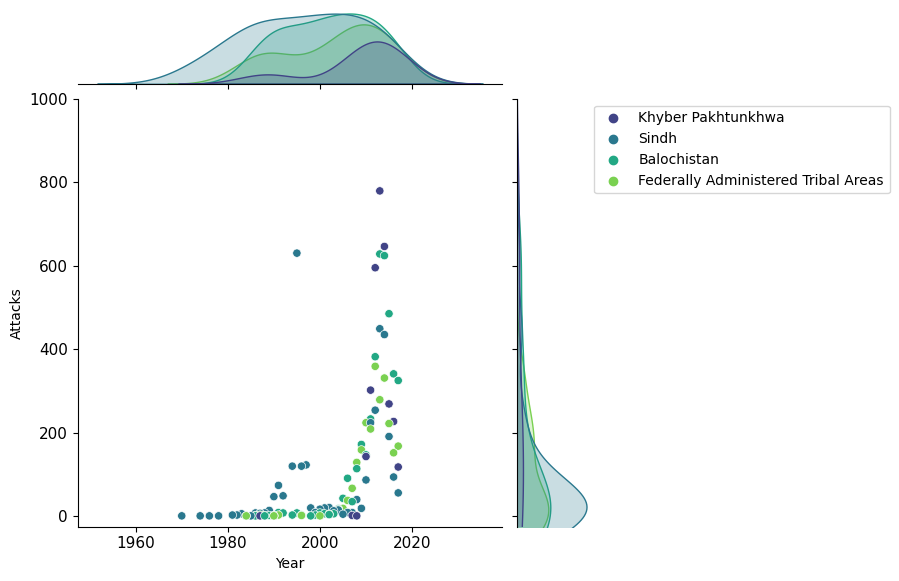

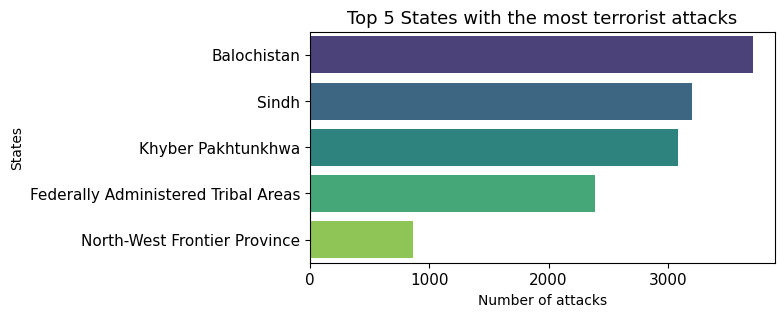

In [ ]:
#Visual 3-

#Jointplot code - 

sns.jointplot(data = mask_p,x = 'Year',y = 'Attacks',hue = 'State', palette = 'viridis')
plt.ylim(-25,1000)
plt.legend(bbox_to_anchor = (1.2,1),fontsize =10)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)
plt.show()

#Barplot code - 

plt.figure(figsize = (6,3))
sns.barplot(data = pak_states, x = 'Atacks', y = 'State', palette = 'viridis')

plt.title('Top 5 States with the most terrorist attacks',fontsize = 13)
plt.xlabel('Number of attacks')
plt.ylabel('States')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

plt.show()

### 3.3. No.3 Most affected Country - Afghanistan : 

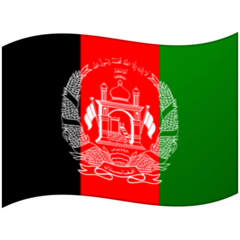

In [ ]:
#Code-

Afghanistan_loc_df = location_df[location_df['Country'] == 'Afghanistan'].dropna(how = 'any')
afghan_states = pd.DataFrame(Afghanistan_loc_df['State'].value_counts().reset_index())
afghan_states.columns= ['State','Atacks']
afghan_states = afghan_states.head(5)

mask_a = pd.DataFrame(Afghanistan_loc_df[['Year','State']].value_counts().reset_index())
mask_a.columns = ['Year','State','Attacks']
list_of_top = ['Helmand','Kandahar','Nangarhar','Kabul','Ghazni']
mask_a = mask_a[mask_a.State.isin(list_of_top)]


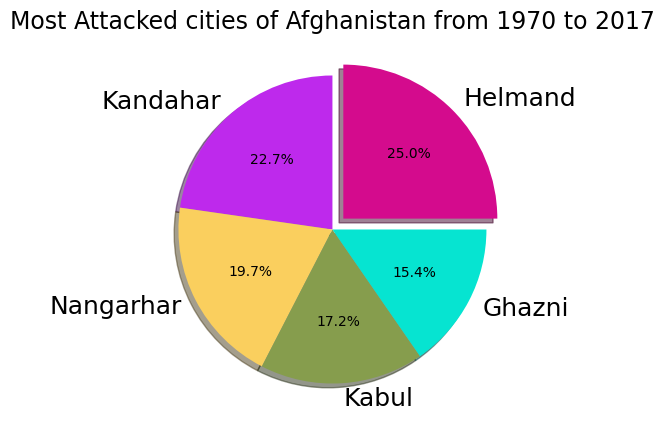

In [ ]:
#Visual 1- 
#Pieplot code - 

plt.figure(figsize=(5,5))
df = afghan_states['Atacks']
explode = (0.1, 0,0, 0,0) 
colors = ['#d40b8d','#be29ec','#facf5e','#869d4d','#06e4d1']
plt.pie(df, labels=afghan_states['State'], autopct='%1.1f%%',explode = explode, shadow = True, colors = colors)
plt.title("Most Attacked cities of Afghanistan from 1970 to 2017",fontsize=17,color='Black')
plt.show()


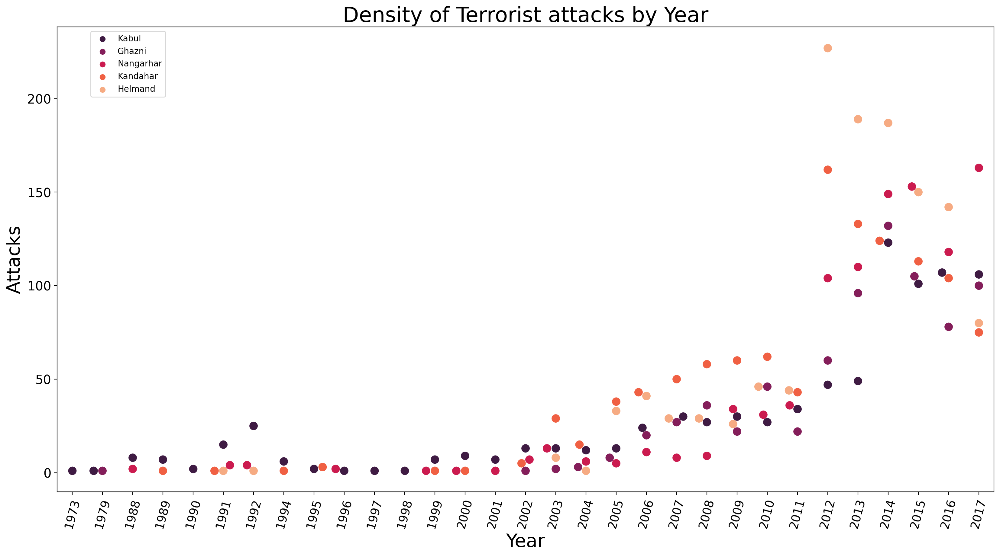

In [ ]:
#Visual 2-
#Swarmplot code - 
plt.figure(figsize = (20,10), dpi = 200)
sns.swarmplot(data = mask_a, x = 'Year',y = 'Attacks', hue = 'State',size = 10,palette = 'rocket')
plt.xticks(rotation = 75, fontsize = 14)
plt.yticks(fontsize = 15)
plt.xlabel('Year',fontsize = 22)
plt.ylabel('Attacks',fontsize = 22)
plt.title('Density of Terrorist attacks by Year',fontsize = 25)
plt.legend(bbox_to_anchor = (0.12,1))
plt.show()

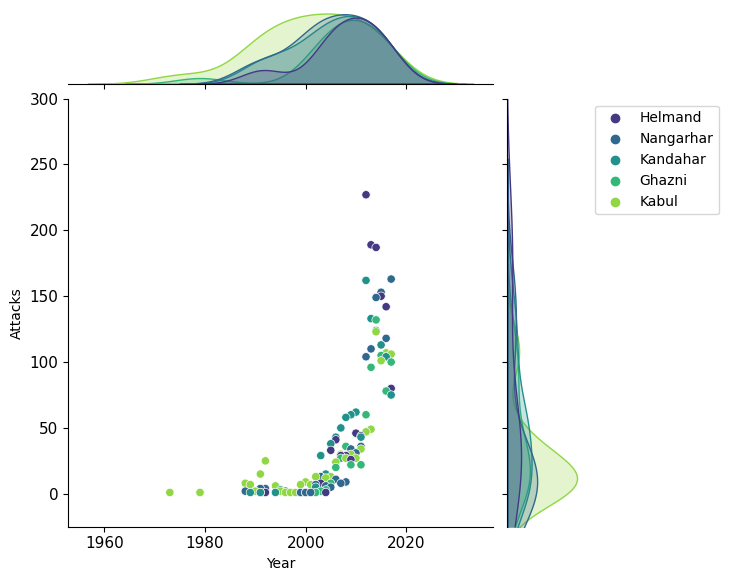

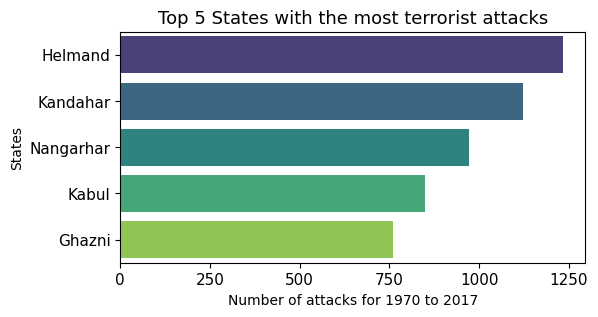

In [ ]:
#Visual 3-
#Jointplot code - 

sns.jointplot(data = mask_a,x = 'Year',y = 'Attacks',hue = 'State',palette = 'viridis')
plt.ylim(-25,300)
plt.legend(bbox_to_anchor = (1.55,1),fontsize =10)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)
plt.show()

#Barplot code - 

plt.figure(figsize = (6,3))
sns.barplot(data = afghan_states, x = 'Atacks', y = 'State', palette = 'viridis')

plt.title('Top 5 States with the most terrorist attacks', fontsize = 13)
plt.xlabel('Number of attacks for 1970 to 2017')
plt.ylabel('States')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

plt.show()

## 4.Terror distribution across the globe -

### 4.1.World Map showing distribution of Terror strikes : 

In [ ]:
#Code-
#Using Plotly Geo-Scatter plot - 
fig = px.scatter_geo(location_df,lat='latitude',lon='longitude',hover_name="Country",color="Region")
fig.update_geos(projection_type="orthographic")
fig.update_layout(title='World wide Terrorist Attacked Regions (1970-2017)',title_x=0.5)
fig.update_layout(height=350, margin={"r":0,"t":35,"l":0,"b":0})
fig.show()

### 4.2.Number of Terror Attacks in Different Countries from 1970-2014: 

In [ ]:
#Code - 
#Using Plotly Choropleth -

attacks_time_lapse = pd.DataFrame(gt_df.groupby(["Year" , "Country"])["Year"].count() , 
                                  columns = ["Year"]).rename(columns = {"Year" : "attacks"}).reset_index()

attacks_time_lapse_choropleth = px.choropleth(attacks_time_lapse , locations = "Country" , locationmode = "country names" , 
              color = "attacks" , animation_group = "attacks" , 
              animation_frame = "Year" , labels={"attacks" : "Number of Attacks"} ,
              title = "Number of Terror Attacks in Different Countries from 1970-2014")
attacks_time_lapse_choropleth.show()